# **Inference with a pretrained classifier**

In [ ]:
!pip install -q keras-cv
!pip install -q keras-core

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.1/613.1 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 18.0 MB/s eta 0:00:00


In [ ]:
import keras_cv
import keras_core as keras
import numpy as np

Using TensorFlow backend


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
file_path = keras.utils.get_file(origin="https://i.natgeofe.com/n/548467d8-c5f1-4551-9f58-6817a8d2c45e/NationalGeographic_2572187_square.jpg")

1155285/1155285 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step       


In [ ]:
image = np.array(keras.utils.load_img(file_path))

In [ ]:
image_resized = keras.ops.image.resize(image, (640, 640))[None, ...]

In [ ]:
model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format = "xywh",
)
predictions = model.predict(image_resized)

100%|██████████| 2.27k/2.27k [00:00<00:00, 1.72MB/s]
100%|██████████| 99.5M/99.5M [00:03<00:00, 30.3MB/s]
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids


1/1 [==============================] - 7s 7s/step


In [ ]:
class_ids = [
    "aeroplane", "bicycle", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow",
    "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor"
]

In [ ]:
class_mapping = dict(zip(range(len(class_ids)), class_ids))

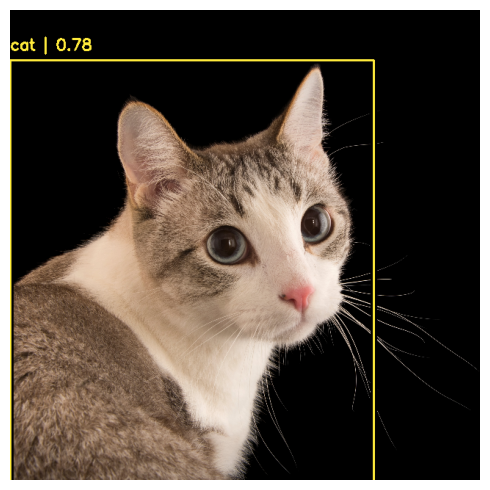

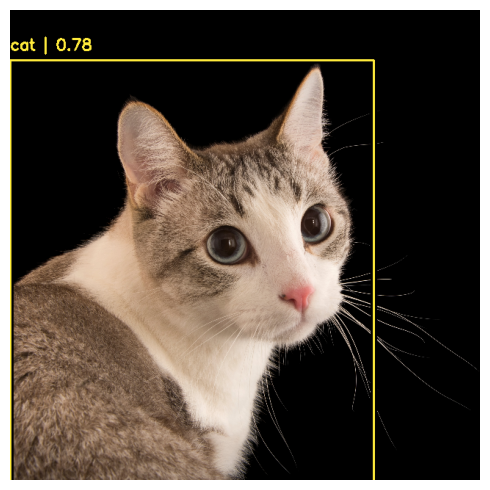

In [ ]:
keras_cv.visualization.plot_bounding_box_gallery(
    image_resized,
    value_range=(0, 255),
    rows= 1,
    cols=1,
    y_pred = predictions,
    scale =5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,

)

# **Fine-tuning a pretrained backbone**

In [ ]:
!kaggle datasets download -d siddharth1o1/anmial-classfier


 50% 1.00M/1.99M [00:00<00:00, 2.02MB/s]
100% 1.99M/1.99M [00:00<00:00, 3.45MB/s]


In [ ]:
!unzip anmial-classfier.zip


In [ ]:
import tensorflow as tf

dataset_path = '/content'  # Adjust as necessary

train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(640, 640),  # Match the input size of your model
    batch_size=32  # Adjust based on your system's capabilities
)

val_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(640, 640),  # Match the input size of your model
    batch_size=32  # Adjust based on your system's capabilities
)


Found 364 files belonging to 6 classes.
Using 292 files for training.
Found 364 files belonging to 6 classes.
Using 72 files for validation.


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.cache().prefetch(buffer_size=AUTOTUNE)


In [ ]:
from tensorflow.keras import layers, models

# Assuming `backbone` is your YOLOv8 pretrained backbone loaded earlier
# Remove detection layers and add classification head
x = layers.GlobalAveragePooling2D()(backbone.output)
output = layers.Dense(6, activation='softmax')(x)  # 6 classes

model = models.Model(inputs=backbone.input, outputs=output)


In [ ]:
for layer in backbone.layers:
    layer.trainable = False


In [ ]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  # Use this if your labels are integers
              metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_dataset,
    epochs=2,  # Adjust based on your needs
    validation_data=val_dataset
)


Epoch 1/2
10/10 [==============================] - 102s 10s/step - loss: 2.8257 - accuracy: 0.5308 - val_loss: 1.8826 - val_accuracy: 0.5278
Epoch 2/2
10/10 [==============================] - 95s 10s/step - loss: 1.4256 - accuracy: 0.5103 - val_loss: 1.7172 - val_accuracy: 0.5833


In [ ]:
epochs_range = range(2)  # Adjust to match the number of epochs you actually trained for


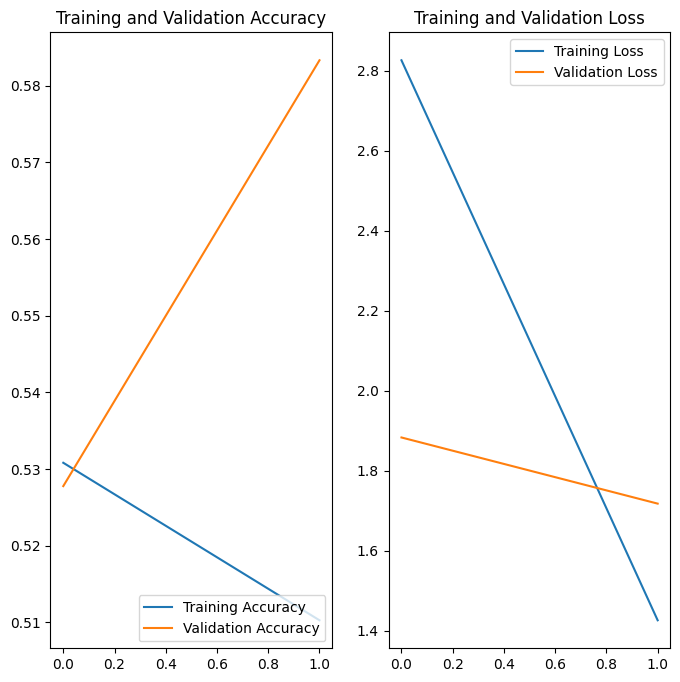

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(2)  # Adjusted to match the number of epochs

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


# **Custom Train**

In [ ]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from tensorflow import keras

import requests
from zipfile import ZipFile
from tqdm import tqdm
from keras_cv import bounding_box
from keras_cv import visualization

In [ ]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"joashmuganda","key":"b24cac2c54532e2fc28064e269bcdd07"}'}

In [ ]:
!pip install kaggle


In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d mbkinaci/fruit-images-for-object-detection


 85% 24.0M/28.4M [00:01<00:00, 19.7MB/s]
100% 28.4M/28.4M [00:01<00:00, 18.6MB/s]


In [ ]:
!unzip fruit-images-for-object-detection.zip


In [ ]:
# List the contents of the current working directory
!ls /content




 fruit-images-for-object-detection.zip	 kaggle.json   test_zip
'kaggle (1).json'			 sample_data   train_zip


In [ ]:
!ls /content/test_zip/test


In [ ]:
!ls /content/train_zip/train



In [ ]:
SPLIT_RATIO = 0.2
BATCH_SIZE = 8
LEARNING_RATE = 0.0001
EPOCH = 1
GLOBAL_CLIPNORM = 10.0
IMG_SIZE = (640, 640)


In [ ]:
import os
from tqdm import tqdm

# Define your class IDs and class mapping
class_ids = ["apple", "banana", "orange", "mixed"]  # Replace with your actual fruit classes
class_mapping = dict(zip(range(len(class_ids)), class_ids))

# Define the paths to your image and annotation directories
path_images = "/content/train_zip/train/"  # Path to the images
path_annot = "/content/train_zip/train/"   # Path to the annotations

# Generate sorted lists of XML and JPEG file paths
xml_files = sorted(
    [
        os.path.join(path_annot, file_name)
        for file_name in os.listdir(path_annot)
        if file_name.endswith(".xml")
    ]
)

jpg_files = sorted(
    [
        os.path.join(path_images, file_name)
        for file_name in os.listdir(path_images)
        if file_name.endswith(".jpg")
    ]
)



In [ ]:
import os
import xml.etree.ElementTree as ET

def parse_annotation(xml_file, path_images, class_mapping):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    image_name = root.find('filename').text
    image_path = os.path.join(path_images, image_name)

    boxes = []
    classes = []
    for obj in root.iter('object'):
        cls = obj.find('name').text
        classes.append(cls)

        bbox = obj.find('bndbox')
        xmin = float(bbox.find('xmin').text)
        ymin = float(bbox.find('ymin').text)
        xmax = float(bbox.find('xmax').text)
        ymax = float(bbox.find('ymax').text)
        boxes.append([xmin, ymin, xmax, ymax])

    class_ids = [list(class_mapping.keys())[list(class_mapping.values()).index(cls)] for cls in classes]

    return image_path, boxes, class_ids


In [ ]:
# Lists to hold the parsed data
image_paths = []
bbox = []
classes = []

# Loop through each XML file and extract information
for xml_file in tqdm(xml_files):
    # Parse each XML file using the modified function
    image_path, boxes, class_ids = parse_annotation(xml_file, path_images, class_mapping)

    # Append the results to the respective lists
    image_paths.append(image_path)  # Add the full image path to the list
    bbox.append(boxes)              # Add the bounding boxes to the list
    classes.append(class_ids)       # Add the class ID numbers to the list


100%|██████████| 240/240 [00:00<00:00, 8591.95it/s]


In [ ]:
import tensorflow as tf

# Convert the bounding boxes, classes, and image paths to tensor slices for use in a TensorFlow dataset
bbox = tf.ragged.constant(bbox)  # bounding boxes
classes = tf.ragged.constant(classes)  # class ids
image_paths = tf.ragged.constant(image_paths)  # image file paths

# Create a TensorFlow dataset from the tensor slices
data = tf.data.Dataset.from_tensor_slices((image_paths, classes, bbox))

# Determine the number of validation samples
SPLIT_RATIO = 0.2  # The split ratio for the validation set
num_val = int(len(xml_files) * SPLIT_RATIO)

# Split the dataset into train and validation sets
val_data = data.take(num_val)
train_data = data.skip(num_val)

# Function to load the image from a file path
def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    return image

# Function to load the dataset: images and bounding boxes
def load_dataset(image_path, classes, bbox):
    # Load the image from the path
    image = load_image(image_path)

    # Create a dictionary for bounding boxes and class IDs
    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),
        "boxes": bbox
    }

    # Return the image and its bounding boxes
    return {"images": image, "bounding_boxes": bounding_boxes}


In [ ]:
augmenter = keras.Sequential(
    layers=[
        keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xyxy"),
        # keras_cv.layers.RandomGaussianBlur(kernel_size=(3, 3), factor=(0.5, 0.5)),
        # keras_cv.layers.RandomBrightness(factor=(0.5, 0.5)),
        # keras_cv.layers.RandomContrast(value_range=(0, 255), factor=(0.1, 0.9)),
        keras_cv.layers.JitteredResize(
            target_size=IMG_SIZE,
            scale_factor=(0.75, 1.3),
            bounding_box_format="xyxy",
        ),
    ]
)


In [ ]:
train_ds = train_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(BATCH_SIZE * 4)
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
train_ds = train_ds.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)



In [ ]:
resizing = keras_cv.layers.JitteredResize(
    target_size=(640, 640),
    scale_factor=(1.0, 1.0),
    bounding_box_format="xyxy",
)

val_ds = val_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.shuffle(BATCH_SIZE * 4)
val_ds = val_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
val_ds = val_ds.map(resizing, num_parallel_calls=tf.data.AUTOTUNE)

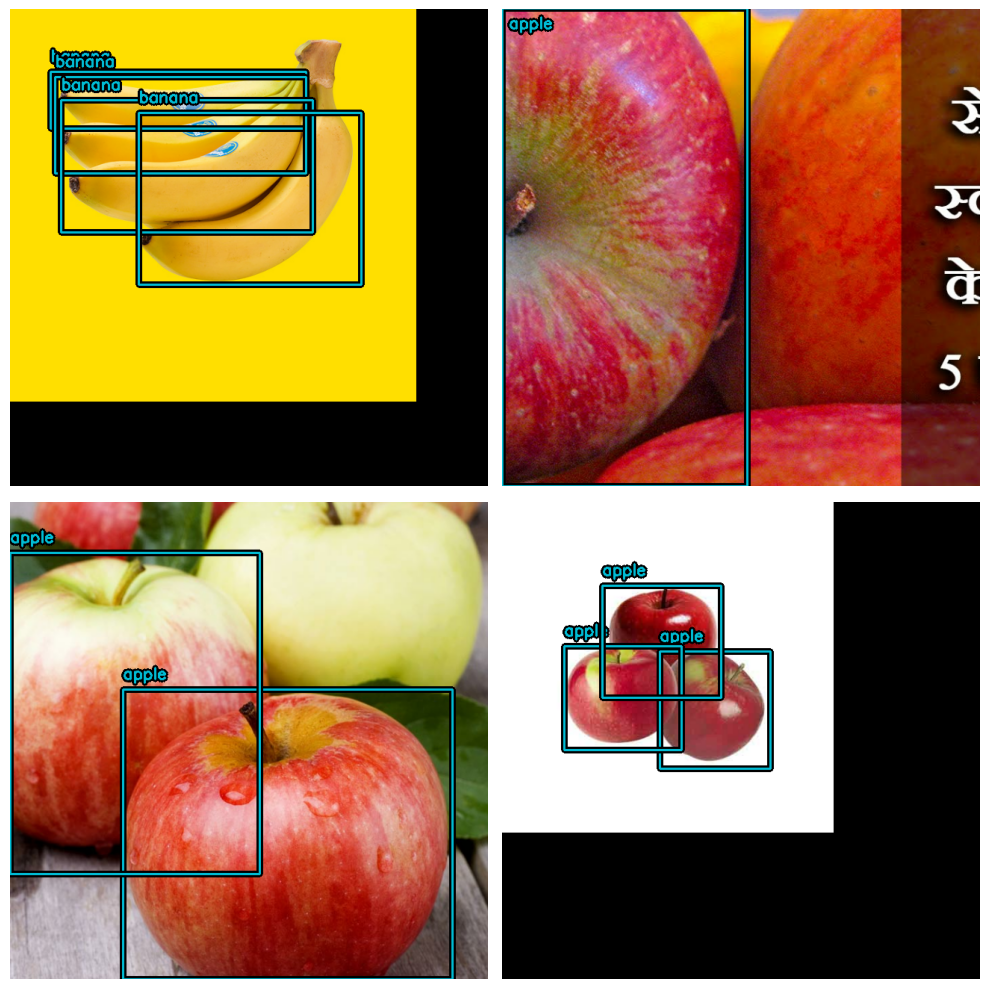

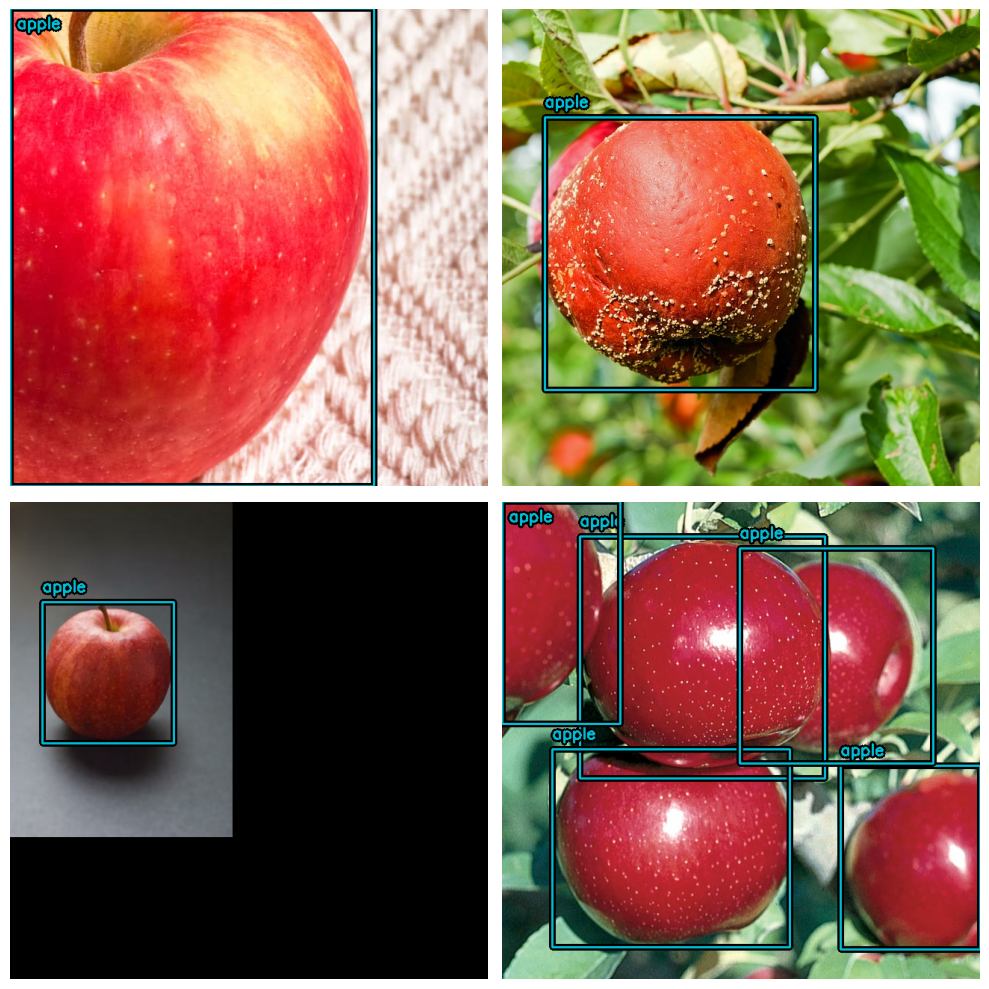

In [ ]:
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


visualize_dataset(
    train_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2
)

visualize_dataset(
    val_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2
)

In [ ]:

def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

val_ds = val_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

In [ ]:
backbone = keras_cv.models.YOLOV8Backbone.from_preset(
    "yolo_v8_l_backbone_coco",
    load_weights=True
)

yolo = keras_cv.models.YOLOV8Detector(
    num_classes=len(class_mapping),
    bounding_box_format="xyxy",
    backbone=backbone,
    fpn_depth=3,
)

yolo.summary()

100%|██████████| 647/647 [00:00<00:00, 1.34MB/s]
100%|██████████| 76.1M/76.1M [00:03<00:00, 20.0MB/s]
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/backbones/backbone.py:44: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids


Model: "yolov8_detector_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 model_1 (Functional)        {'P3': (None, None, None,    1983174   ['input_4[0][0]']             
                             256),                        4                                       
                              'P4': (None, None, None,                                            
                             512),                                                                
                              'P5': (None, None, None,                                            
                             512)}                                                

In [ ]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LEARNING_RATE,
    global_clipnorm=GLOBAL_CLIPNORM,
)

yolo.compile(
    optimizer=optimizer, classification_loss="binary_crossentropy", box_loss="ciou"
)

In [ ]:
class EvaluateCOCOMetricsCallback(keras.callbacks.Callback):
    def __init__(self, data, save_path):
        super().__init__()
        self.data = data
        self.metrics = keras_cv.metrics.BoxCOCOMetrics(
            bounding_box_format="xyxy",
            evaluate_freq=1e9,
        )

        self.save_path = save_path
        self.best_map = -1.0

    def on_epoch_end(self, epoch, logs):
        self.metrics.reset_state()
        for batch in self.data:
            images, y_true = batch[0], batch[1]
            y_pred = self.model.predict(images, verbose=0)
            self.metrics.update_state(y_true, y_pred)

        metrics = self.metrics.result(force=True)
        logs.update(metrics)

        current_map = metrics["MaP"]
        if current_map > self.best_map:
            self.best_map = current_map
            self.model.save(self.save_path)  # Save the model when mAP improves

        return logs

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs_yolov8large")


In [ ]:
history = yolo.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCH,
    callbacks=[
        EvaluateCOCOMetricsCallback(val_ds, "model_yolov8large.h5"),
        tensorboard_callback
    ],
)

1/1 [==============================] - 7s 7s/step


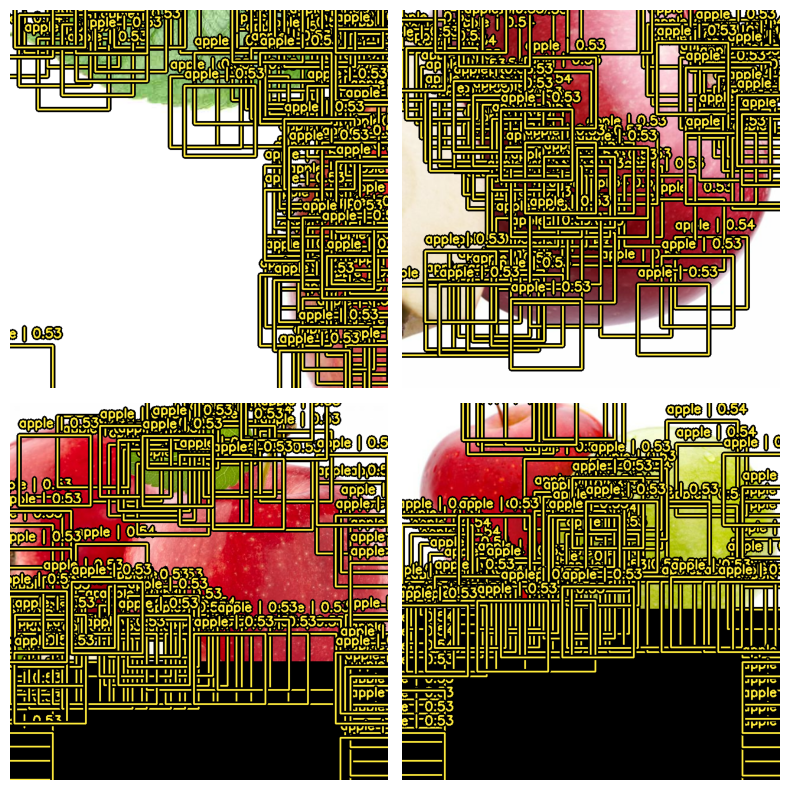

1/1 [==============================] - 6s 6s/step


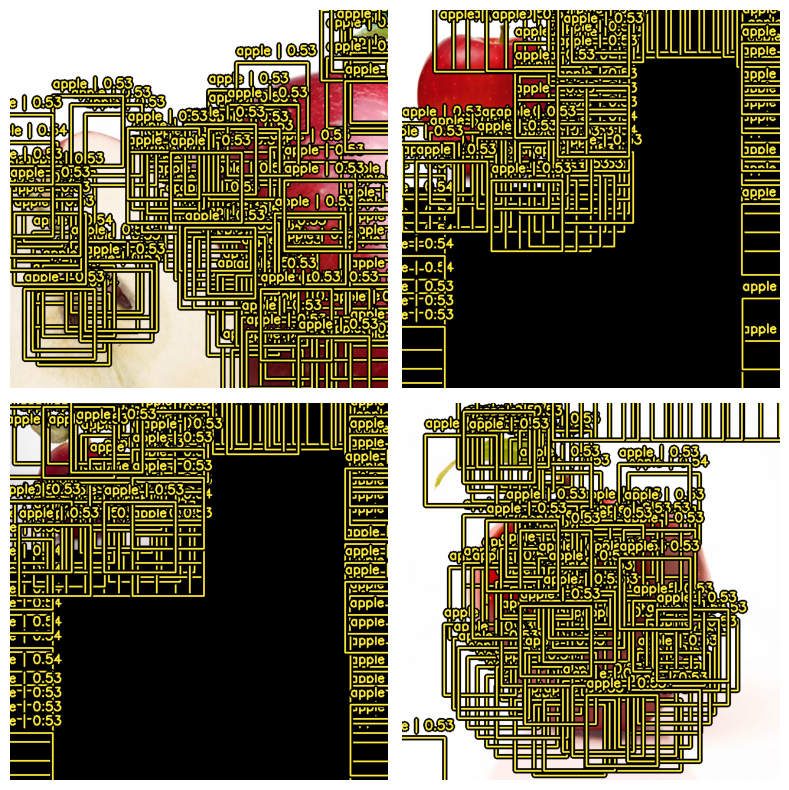

1/1 [==============================] - 7s 7s/step


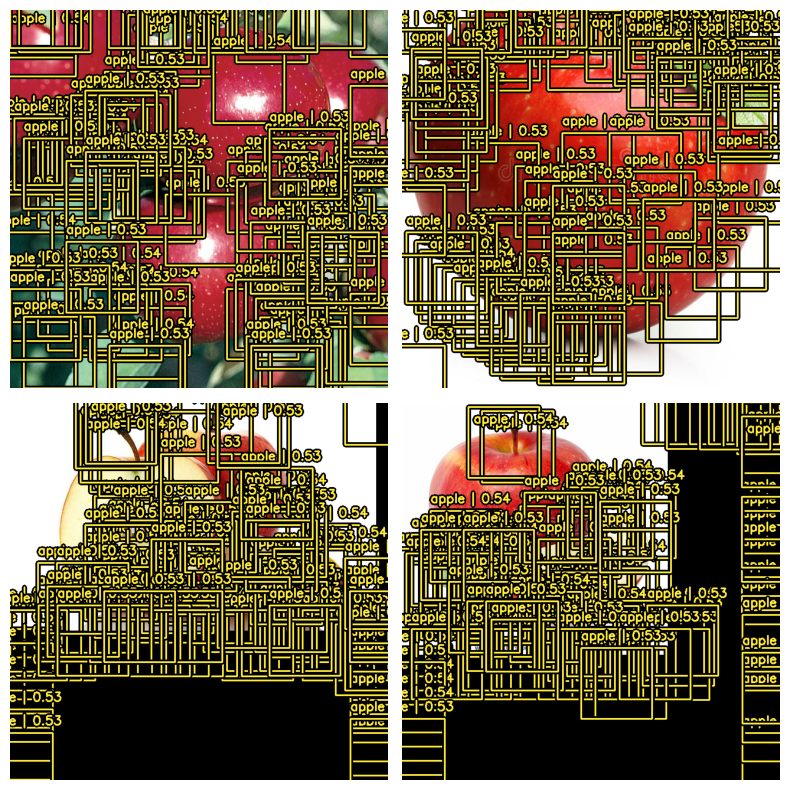

1/1 [==============================] - 7s 7s/step


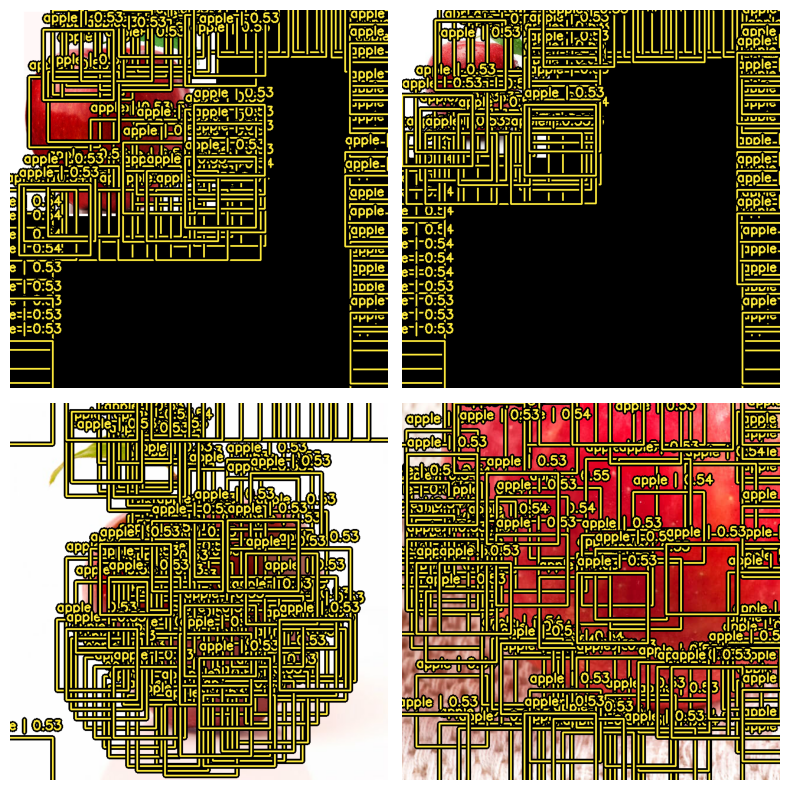

1/1 [==============================] - 7s 7s/step


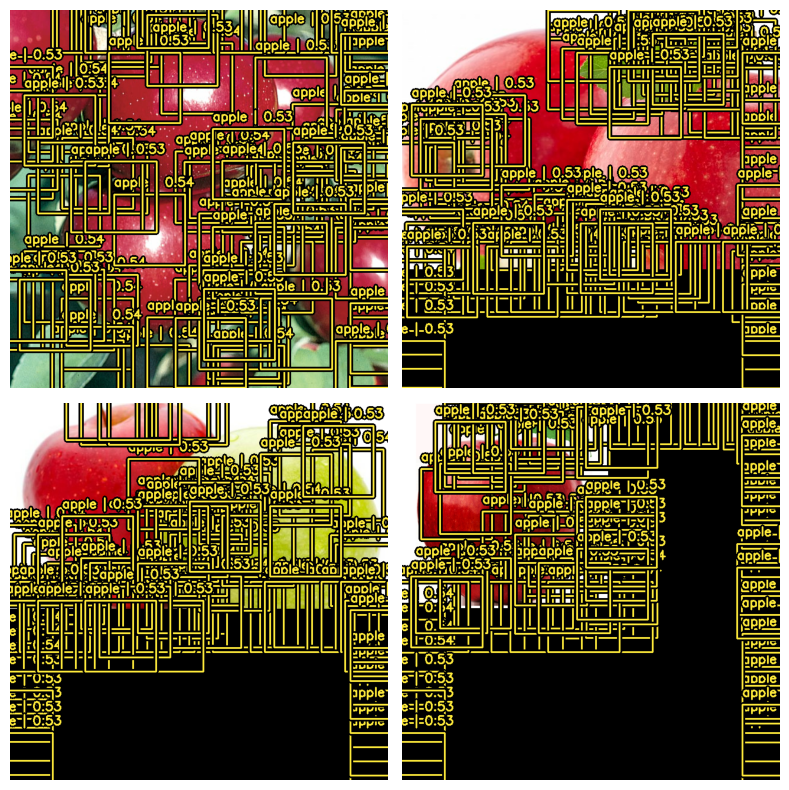

1/1 [==============================] - 6s 6s/step


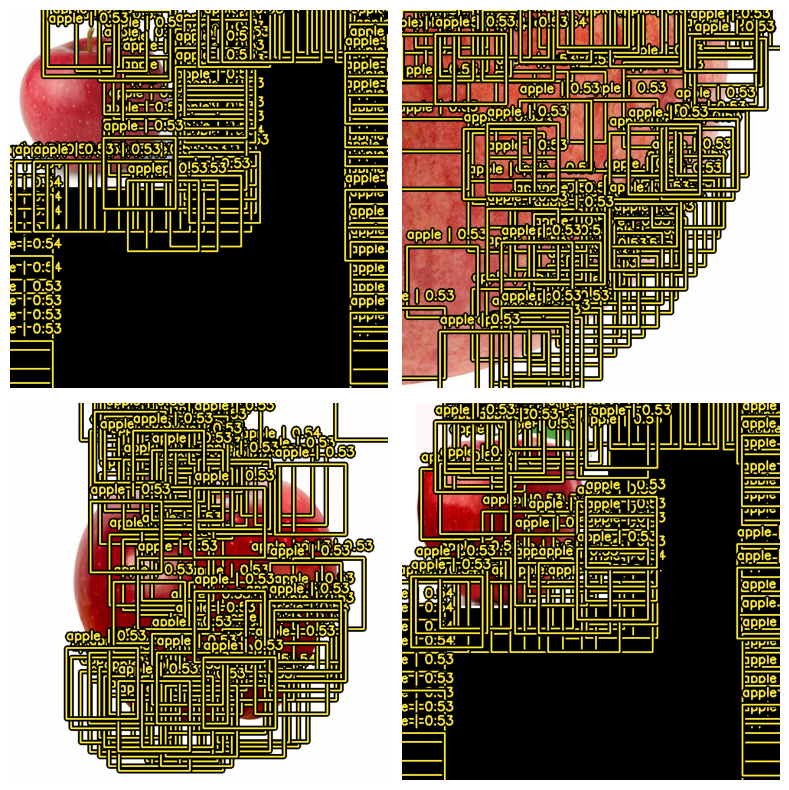

1/1 [==============================] - 7s 7s/step


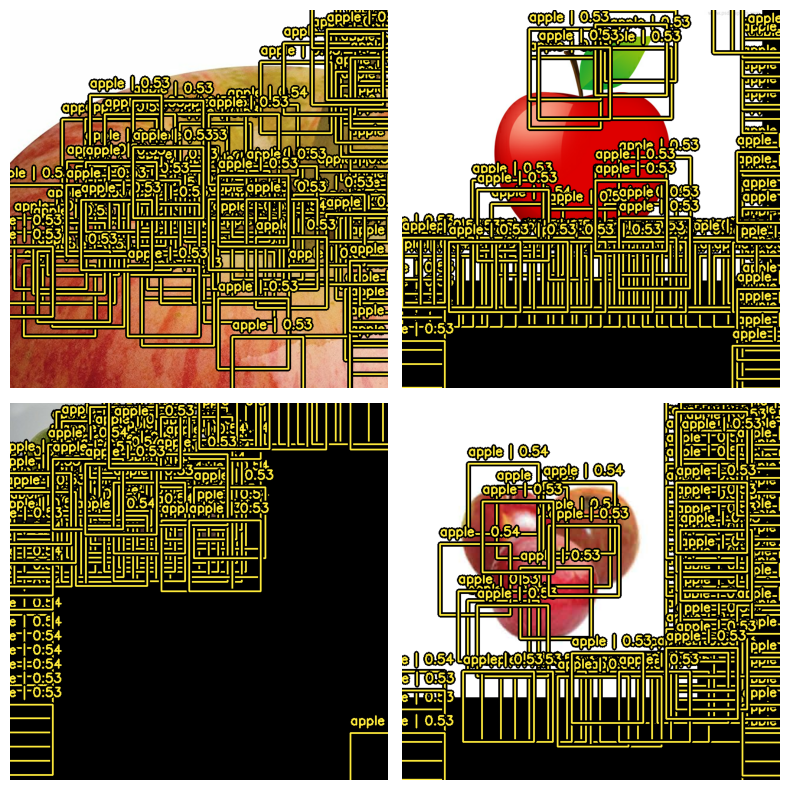

1/1 [==============================] - 6s 6s/step


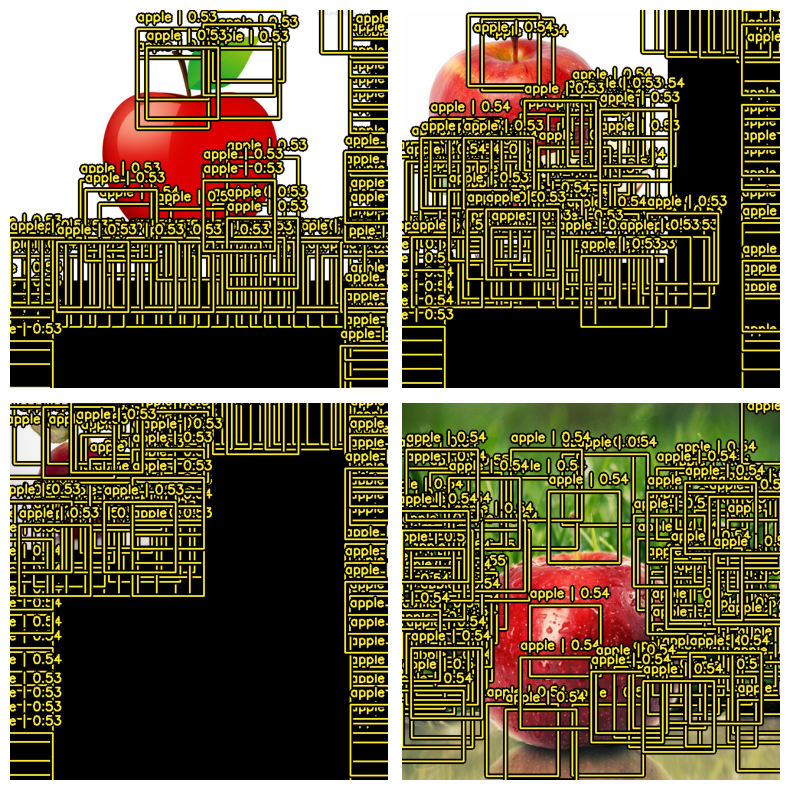

1/1 [==============================] - 7s 7s/step


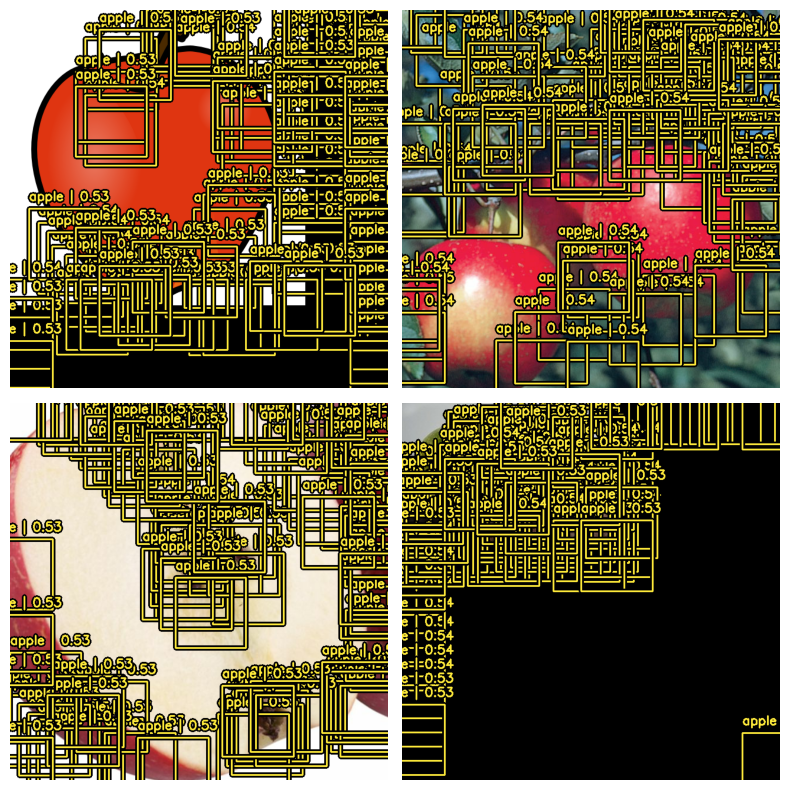

1/1 [==============================] - 7s 7s/step


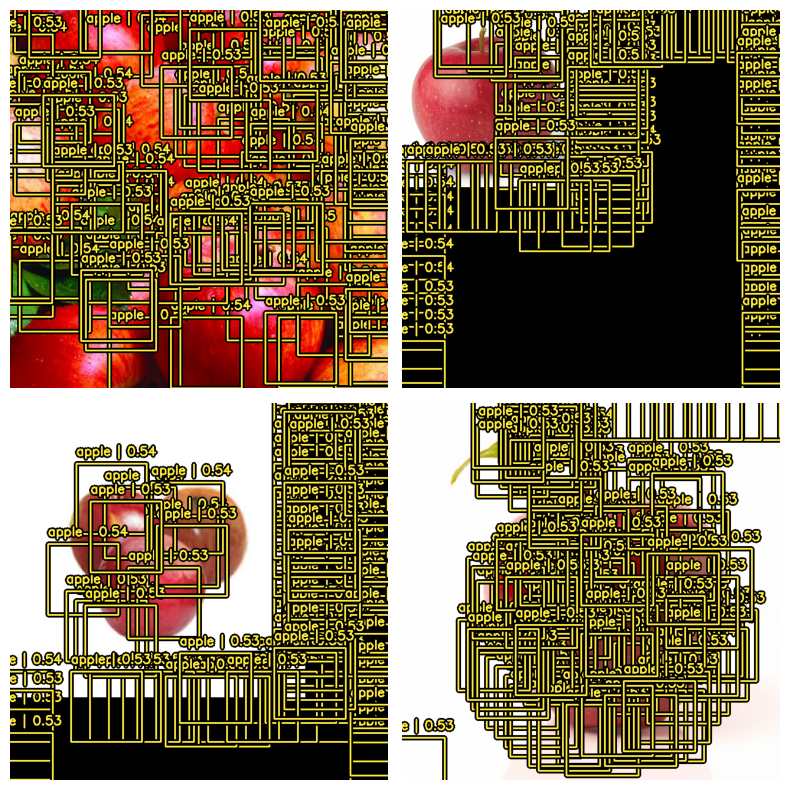

In [ ]:
def visualize_detections(model, dataset, bounding_box_format):
    for i in range(10):
        images, y_true = next(iter(dataset.take(i+1)))
        y_pred = model.predict(images)
        y_pred = bounding_box.to_ragged(y_pred)
        visualization.plot_bounding_box_gallery(
            images,
            value_range=(0, 255),
            bounding_box_format=bounding_box_format,
            # y_true=y_true,
            y_pred=y_pred,
            scale=4,
            rows=2,
            cols=2,
            show=True,
            font_scale=0.7,
            class_mapping=class_mapping,
        )
visualize_detections(yolo, dataset=val_ds, bounding_box_format="xyxy")